In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import cont2discrete
from plant import *

In [2]:
plant_params = {
                'sigma': 20, # Coeficiente de proporcionalidade da corrente de tunelamento
                'work_fn':4.7, # Função trabalho
                'Vb':.5, # Tensão de polarização
                'offset': 5., # distancia do piezo com relação a menor altura
                'm': .1, # Massa do piezo
                'b_': 5, # Coeficiente de viscosidade
                'a': .95, # Coeficiente de pós-escoamento
                'ki': 90, # rigidez
                'd': 90, # Coeficiente do piezo m/V

                # Constantes para medir o deslocamento inerente à histerese
                'alpha': 1, 
                'beta': 0.8,
                'gamma': 0.2,
                'n': 2,}


In [8]:
final = 2*50
dt = 1e-3
sample_rate = dt
t = np.arange(0, final, sample_rate)
atom_radius = 3
n_atoms = 2*10
correction_constant = (atom_radius*n_atoms)/final
w = np.pi*n_atoms/final
h = np.sin(w*t)**2

mi = 1e-3
mi1 = 1e-3
mi2 = 1e1
mi3 = 1e-6

K = 1
tau = .2
reference_model = cont2discrete(([K],[tau,1]), dt=dt, method='euler')
am = reference_model[0].squeeze()
bm = -reference_model[1].squeeze() # inverter por conta da forma do filtro IIR: 1 - b0 - b1 - ... - bn

xd = np.zeros_like(t) + np.log(1)# + 0.005*np.random.uniform(-1, 1, len(t))
y_stm_past = 0
xm = np.zeros_like(am)
ym = np.zeros_like(bm)

y_ref = np.zeros_like(t)



a_plant = np.zeros(6)
b_plant = np.zeros(3)
bias_plant = 0
a_plant[0] = .01


x_plant = np.zeros_like(a_plant)
y_plant = np.zeros_like(b_plant)

Kp = Ki = Kd = 0
up = ui = ud = 0

e = np.zeros(3)

y_pred = np.zeros_like(t)
u_control = np.zeros_like(t)
y_stm = np.zeros_like(t)
z_stm = np.zeros_like(t)
e1 = np.zeros_like(t)
e2 = np.zeros_like(t)
e3 = np.zeros_like(t)
states = np.zeros(3)
delta_z_list = np.zeros_like(t)

a_plant_list = np.zeros((len(a_plant), len(t)))
b_plant_list = np.zeros((len(b_plant)-1, len(t)))
bias_plant_list = np.zeros_like(t)

Kp_list = np.zeros_like(t)
Ki_list = np.zeros_like(t)
Kd_list = np.zeros_like(t)

for i, k in enumerate(t):

    Kp_list[i] = Kp
    Ki_list[i] = Ki
    Kd_list[i] = Kd
    for j in range(len(a_plant)):
        a_plant_list[j, i] = a_plant[j]
    for j in range(len(b_plant)-1):
        b_plant_list[j, i] = b_plant[j+1]
    bias_plant_list[i] = bias_plant

    if i ==0:
        y_stm[i], delta_z_list[i], states = stm_sim(0, h[i] , states, dt,plant_params)
        states = np.zeros(3)
        e1[i] = y_pred[i] - y_stm[i]
    else:
        y_stm[i], delta_z_list[i], states = stm_sim(u_control[i-1], h[i], states, dt,plant_params)
        x_plant = np.roll(x_plant, 1)
        x_plant[0] = u_control[i-1]
        z_stm[i] = states[0]

        y_plant = np.roll(y_plant, 1)
        y_plant[0] = np.dot(a_plant, x_plant) + np.dot(b_plant[1:], y_plant[1:]) + bias_plant
        y_pred[i] = y_plant[0]

        e1[i] = y_pred[i] - y_stm[i]

        a_plant = a_plant - 2*mi*e1[i]*x_plant
        b_plant[1:] = b_plant[1:] - 2*mi*e1[i]*y_plant[1:]
        bias_plant = bias_plant - 2*mi*e1[i]

    
    xm = np.roll(xm,1)
    xm[0] = xd[i]
    ym = np.roll(ym,1)
    if i == 0:
        ym[0] = y_stm[i]
    else:
        ym[0] = np.dot(am, xm) + np.dot(bm[1:], ym[1:])

    
    y_ref[i] = ym[0] # Saída  do modelo de referência
    

    e2[i] = y_pred[i] - y_ref[i]

    e = np.roll(e,1)
    e[0] = y_ref[i] - y_stm[i]
    e3[i] = e[0]
    
    up = Kp*e[1]

    ui = ui + Ki*dt*e[1]

    ud = (Kd/dt)*(e[1] - e[2])

    u_control[i] = up + ui + ud

    Kp = Kp - 2*mi1*e2[i]*a_plant[0]*e[1]
    Ki = Ki - 2*mi2*e2[i]*a_plant[0]*dt*(e[1] + e[2])
    Kd = Kd - 2*mi3*e2[i]*a_plant[0]*(1/dt)*(e[1] - e[2])
    print(Kp, Ki, Kd)


0.0 0.0 0.0
0.0 0.0 0.0
-7.665291953387534e-06 -7.665291953387534e-05 -7.665291953387534e-06
-2.284973606235463e-05 -0.0003046113862027696 -1.5238333504432294e-05
-4.542211936068708e-05 -0.0006811976432794528 -2.2724474393428862e-05
-7.526517914896192e-05 -0.001204015747037815 -3.0128783594142345e-05
-0.00011227481727432999 -0.001870934532258738 -3.745618132278616e-05
-0.00015635930468569585 -0.0026800727013885457 -4.4711339232537093e-05
-0.00020743858285578304 -0.0036297846239671952 -5.189870331484646e-05
-0.0002654436518095329 -0.004718647888679628 -5.902251475110297e-05
-0.00033031603513223765 -0.00594545241427533 -6.608682883694217e-05
-0.0004020073127927376 -0.007309190934980221 -7.309553208745292e-05
-0.00048047871286297986 -0.00880905068121557 -8.005235760440256e-05
-0.000565700753331621 -0.010444406078973135 -8.696089876592833e-05
-0.0006576529251891384 -0.012214812290981269 -9.382462128014978e-05
-0.0007563234077624944 -0.01411999941901786 -0.00010064687362320259
-0.0008617088

In [31]:
import matplotlib.pyplot as plt
import string

import matplotlib
matplotlib.rcParams.update({'font.size': 18})
fig, axs = plt.subplots(4,1)
fig.set_size_inches(20, 20)
fig.tight_layout()
fig.dpi = 400



axs[0].set_ylabel("Distância ($\AA$)")
axs[0].set_xlabel("Tempo ($s$)")
axs[0].plot(t, h, t, h+ delta_z_list)
axs[0].legend(["Superfície da amostra", "Deslocamento do piezo"])


axs[1].set_ylabel("Corrente de tunelamento (nA)")
axs[1].set_xlabel("Tempo ($s$)")
axs[1].plot(t, np.exp(y_stm), 'g', t, np.exp(y_ref),'m--')
axs[1].legend(["Corrente de tunelamento do STM", "Corrente de tunelamento de referência"])

axs[2].set_ylabel("Corrente de tunelamento (nA)")
axs[2].set_xlabel("Tempo ($s$)")
axs[2].plot(t, np.exp(y_stm), 'g', t, np.exp(y_pred),'k--')
axs[2].legend(["Corrente de tunelamento do STM", "Corrente de tunelamento de identificação"])

axs[3].set_ylabel("Tensão aplicada\nno atuador piezoelétrico ($V$)")
axs[3].set_xlabel("Tempo ($s$)")
axs[3].plot(t, plant_params['d']*u_control, 'violet')

for n, ax in enumerate(axs):
    ax.text(-0.08, 1, f'{string.ascii_lowercase[n]})', transform=ax.transAxes, size=15, weight='bold')
plt.show()



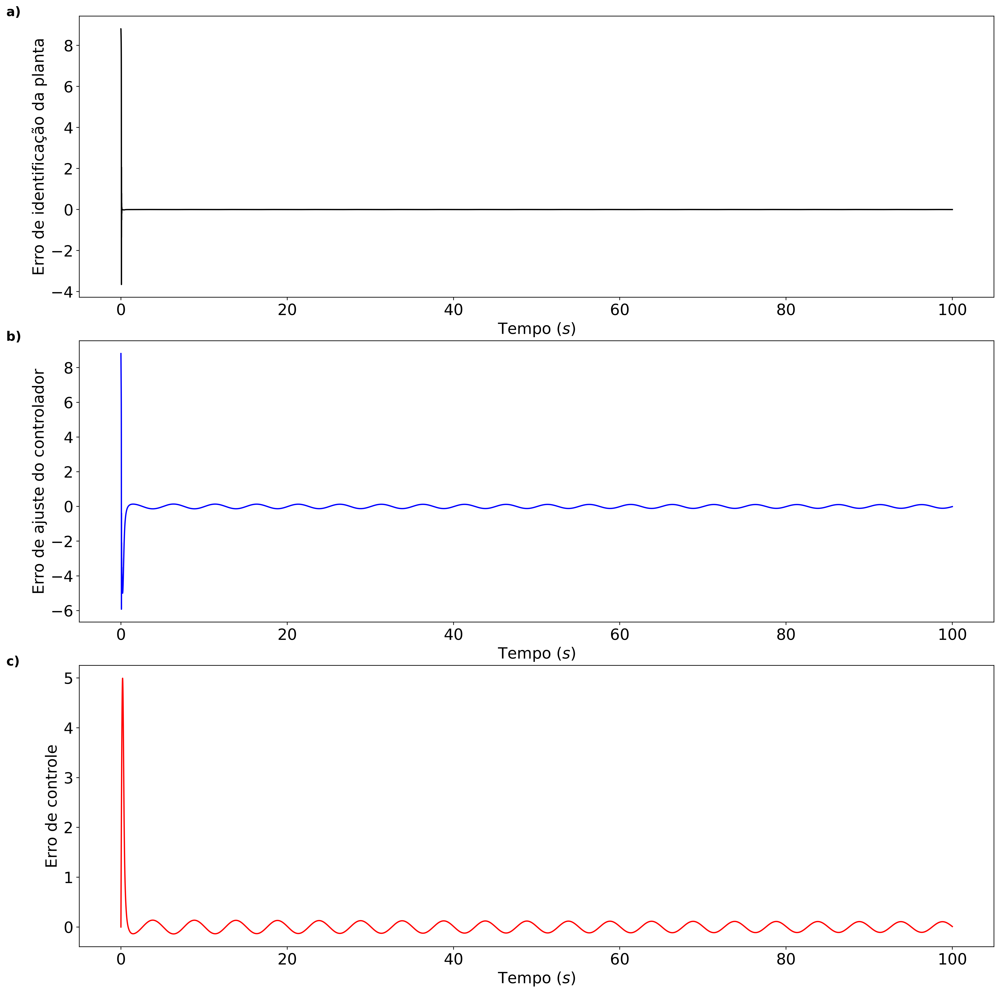

In [29]:
import matplotlib.pyplot as plt
import string

import matplotlib
matplotlib.rcParams.update({'font.size': 18})
fig, axs = plt.subplots(3,1)
fig.set_size_inches(16, 16)
fig.tight_layout()
fig.dpi = 400




axs[0].set_ylabel("Erro de identificação da planta")
axs[0].set_xlabel("Tempo ($s$)")
axs[0].plot(t, e1, 'k')

axs[1].set_ylabel("Erro de ajuste do controlador")
axs[1].set_xlabel("Tempo ($s$)")
axs[1].plot(t, e2, 'b')

axs[2].set_ylabel("Erro de controle")
axs[2].set_xlabel("Tempo ($s$)")
axs[2].plot(t, e3, 'r')


for n, ax in enumerate(axs):
    ax.text(-0.08, 1, f'{string.ascii_lowercase[n]})', transform=ax.transAxes, size=15, weight='bold')
plt.show()



Text(0.5, 136.7222222222222, 'Tempo ($s$)')

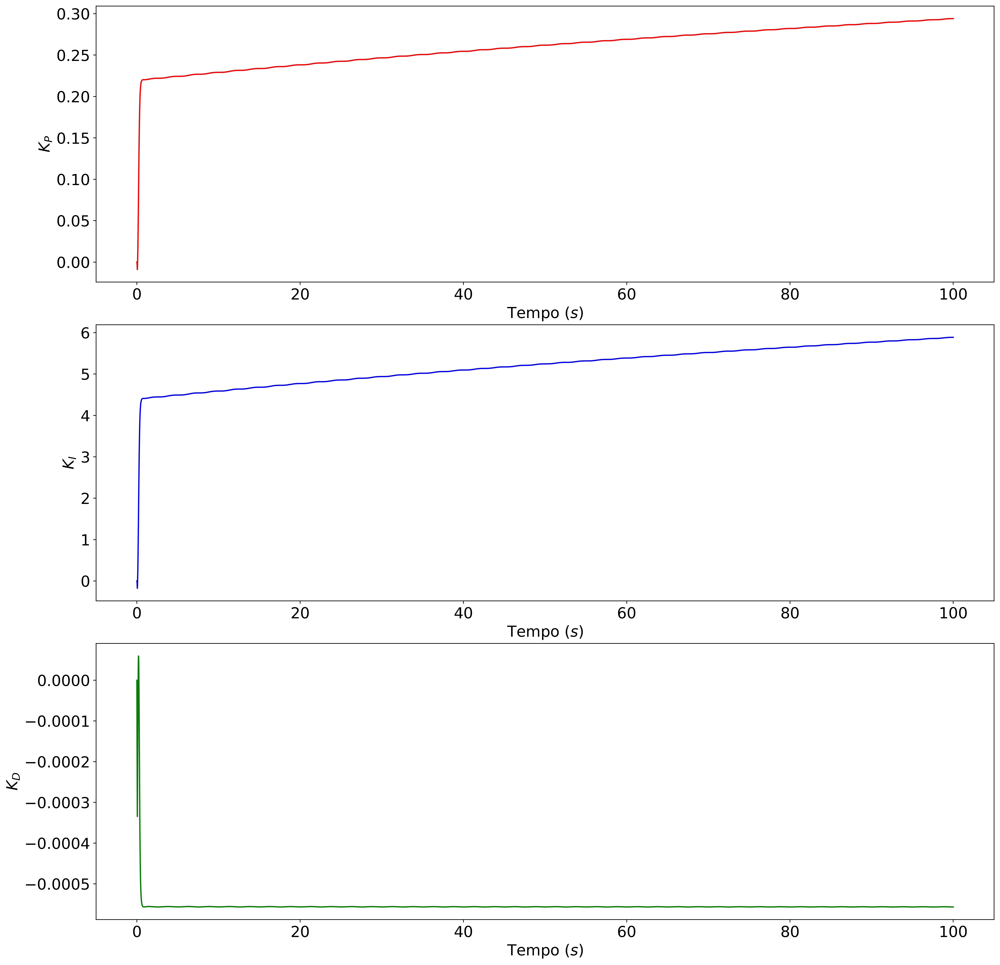

In [30]:
matplotlib.rcParams.update({'font.size': 18})
fig, axs = plt.subplots(3,1)
fig.set_size_inches(16, 16)
fig.tight_layout()
fig.dpi = 400



axs[0].plot(t, Kp_list, 'r')
axs[0].set_ylabel("$K_P$")
axs[0].set_xlabel("Tempo ($s$)")
axs[1].plot(t, Ki_list, 'b')
axs[1].set_ylabel("$K_I$")
axs[1].set_xlabel("Tempo ($s$)")
axs[2].plot(t, Kd_list, 'g')
axs[2].set_ylabel("$K_D$")
axs[2].set_xlabel("Tempo ($s$)")

[]

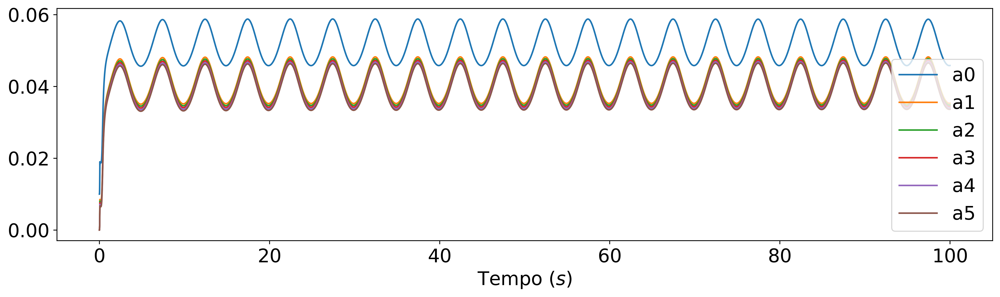

In [18]:
matplotlib.rcParams.update({'font.size': 18})


plt.figure(figsize=(16, 4), dpi=400)
for i in range(len(a_plant_list)):
    plt.plot(t, a_plant_list[i])
plt.legend([f'a{i}' for i in range(len(a_plant_list))])
plt.xlabel("Tempo ($s$)")
plt.plot()

[]

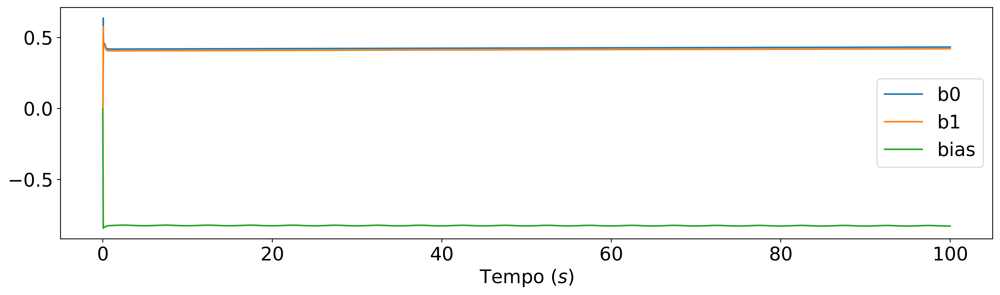

In [21]:
matplotlib.rcParams.update({'font.size': 18})

plt.figure(figsize=(16, 4), dpi=400)
for i in range(len(b_plant_list)):
    plt.plot(t, b_plant_list[i])
plt.plot(t, bias_plant_list)
plt.legend([f'b{i}' for i in range(len(b_plant_list))]+ ['bias'])
plt.xlabel("Tempo ($s$)")
plt.plot()
